In [190]:
from julearn import run_cross_validation
from julearn import PipelineCreator
from julearn.utils import configure_logging
from sklearn.model_selection import StratifiedKFold
from julearn.viz import plot_scores
from junifer.storage import HDF5FeatureStorage
from nilearn import datasets, plotting
from sklearn.model_selection import StratifiedGroupKFold
import numpy as np
import pandas as pd
import os                                                                   
import pickle
import warnings

In [191]:
with open('binary_data.pickle', 'rb') as handle:
    binary_data = pickle.load(handle)
emotion_pairs = list(binary_data.keys())

In [192]:
np.logspace(-1,3,3),

(array([1.e-01, 1.e+01, 1.e+03]),)

In [193]:
emotion_pairs

[('happy', 'sad'),
 ('happy', 'angry'),
 ('happy', 'neutral'),
 ('sad', 'angry'),
 ('sad', 'neutral'),
 ('angry', 'neutral')]

---
# Happy vs Sad

In [288]:
emo = emotion_pairs[0]
feat = list(binary_data[emo].keys())
feat

['parcellation', 'spheres', 'reho_parcellation', 'reho_spheres']

## FC-Parcellation

### No groups

In [289]:
scores = [binary_data[emo][feat[0]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
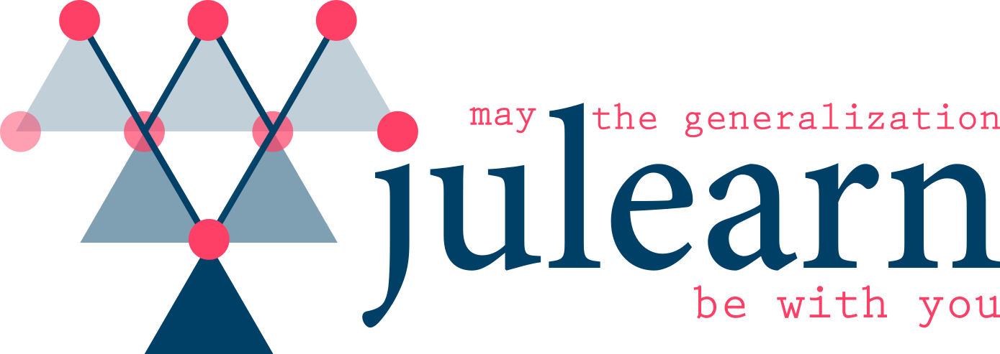

In [196]:
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
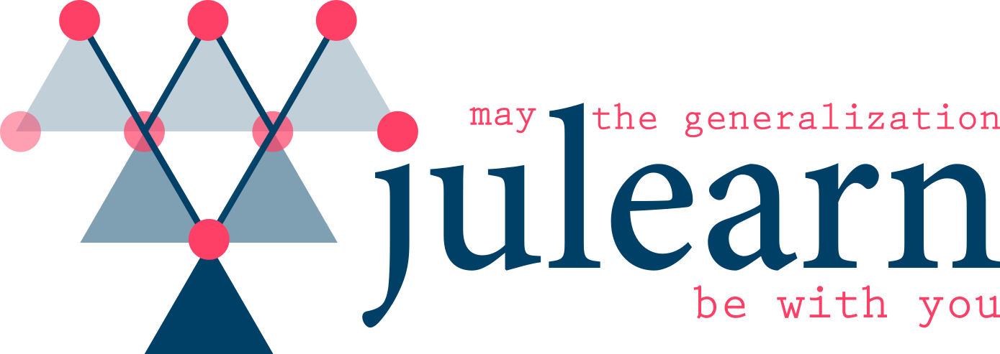

In [197]:
scores = [binary_data[emo][feat[0]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subjects

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
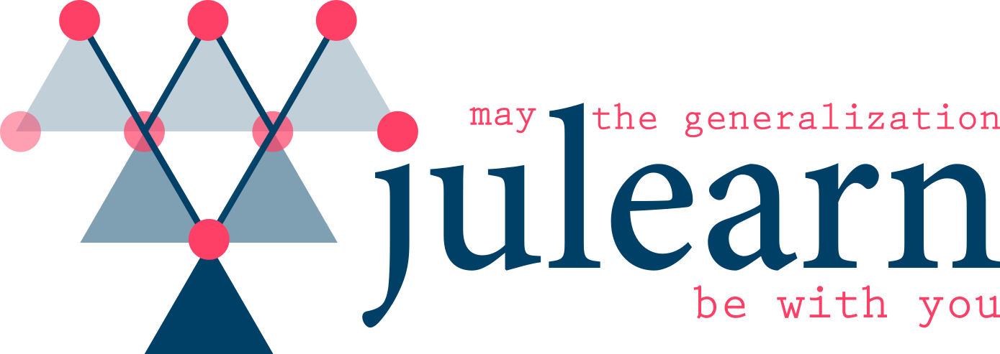

In [292]:
scores = [binary_data[emo][feat[0]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot


In [294]:
print(np.min(scores[0]['test_score']), np.median(scores[0]['test_score']),np.max(scores[0]['test_score']))
print(np.min(scores[1]['test_score']), np.median(scores[1]['test_score']),np.max(scores[1]['test_score']))

0.45 0.5166666666666667 0.5833333333333334
0.36666666666666664 0.45 0.5666666666666667


## FC-Spheres

### No groups

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
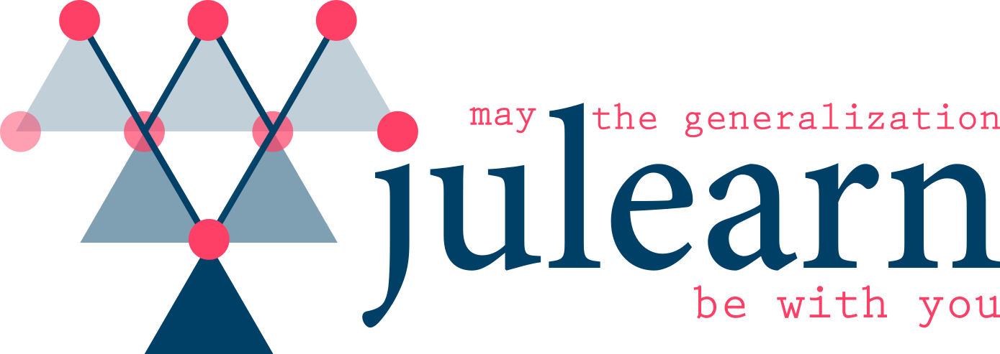

In [199]:
scores = [binary_data[emo][feat[1]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
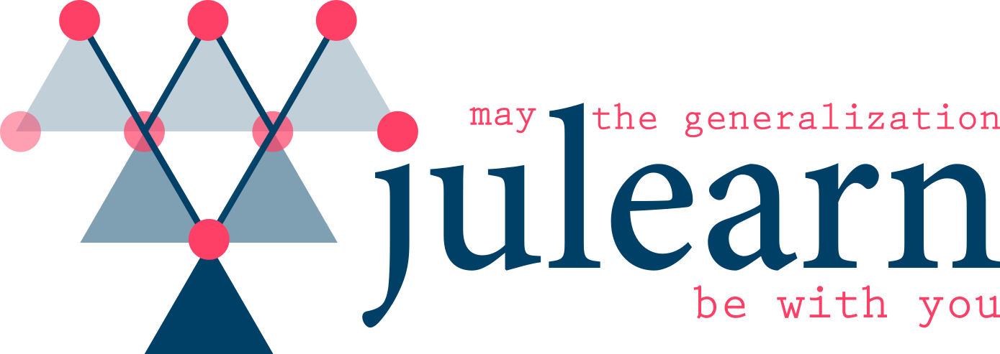

In [200]:
scores = [binary_data[emo][feat[1]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subject

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
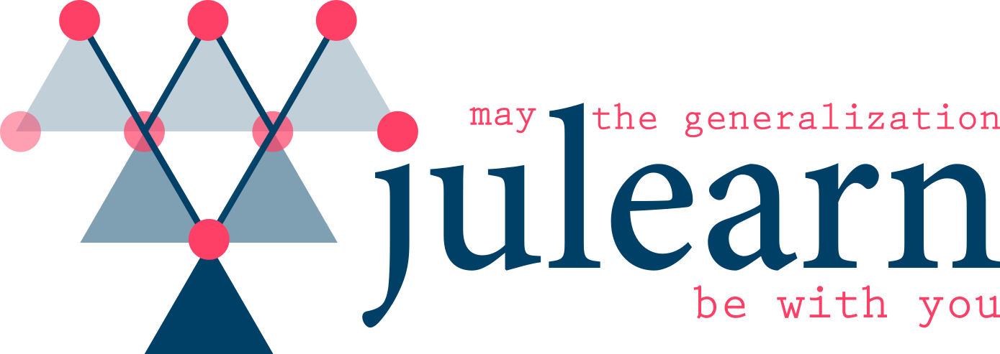

In [295]:
scores = [binary_data[emo][feat[1]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

In [296]:
print(np.min(scores[0]['test_score']), np.median(scores[0]['test_score']),np.max(scores[0]['test_score']))
print(np.min(scores[1]['test_score']), np.median(scores[1]['test_score']),np.max(scores[1]['test_score']))

0.4 0.5 0.6
0.36666666666666664 0.48333333333333334 0.5166666666666667


## ReHo-Parcellation

### No groups

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
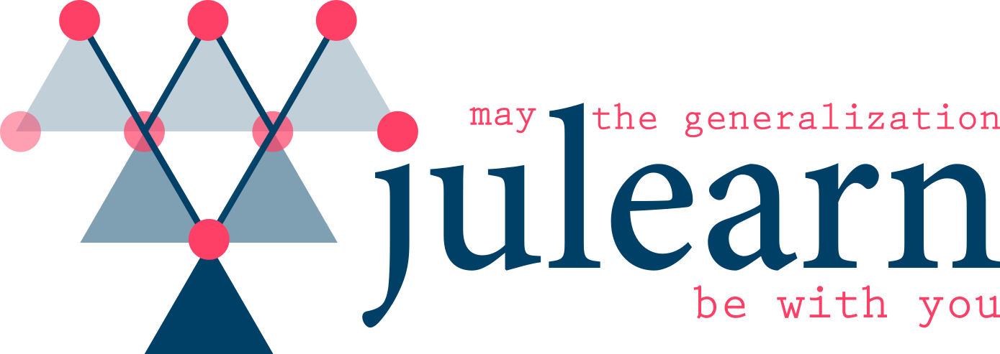

In [202]:
scores = [binary_data[emo][feat[2]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
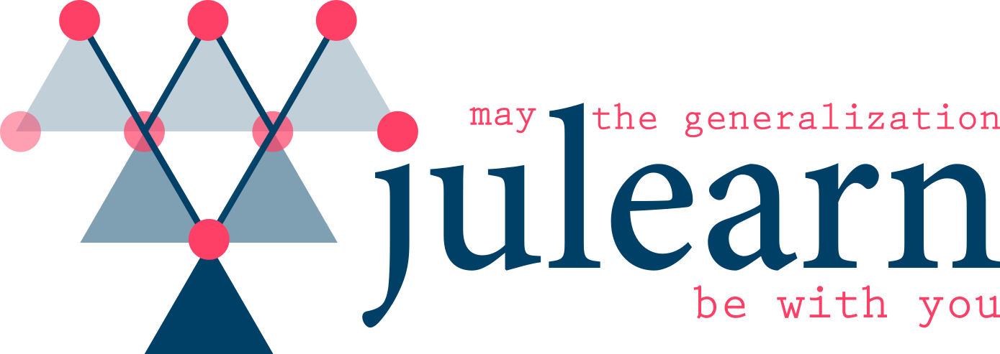

In [203]:
scores = [binary_data[emo][feat[2]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subjects

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
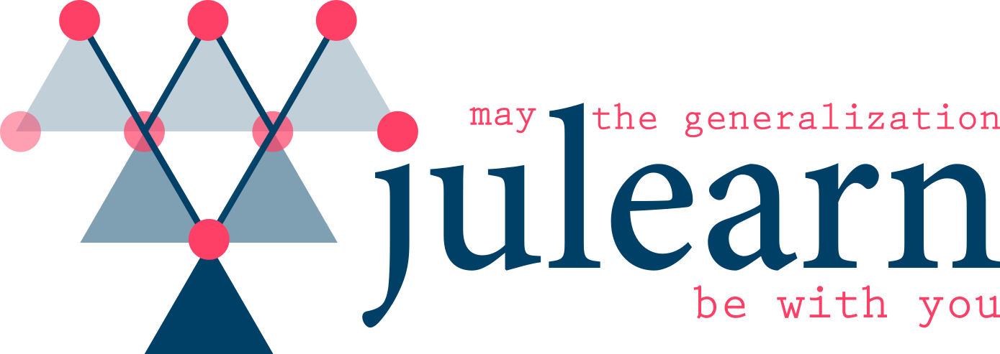

In [297]:
scores = [binary_data[emo][feat[2]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

In [298]:
print(np.min(scores[0]['test_score']), np.median(scores[0]['test_score']),np.max(scores[0]['test_score']))
print(np.min(scores[1]['test_score']), np.median(scores[1]['test_score']),np.max(scores[1]['test_score']))

0.5166666666666667 0.5666666666666667 0.6125
0.4166666666666667 0.45 0.6166666666666667


## ReHo-Spheres

### No groups

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
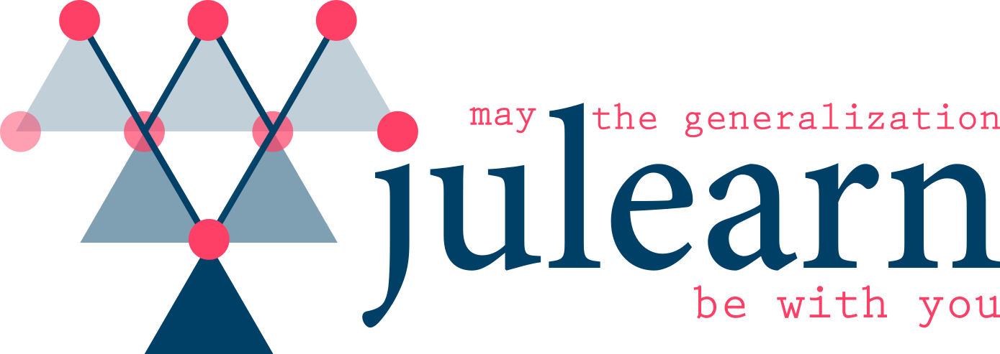

In [205]:
scores = [binary_data[emo][feat[3]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
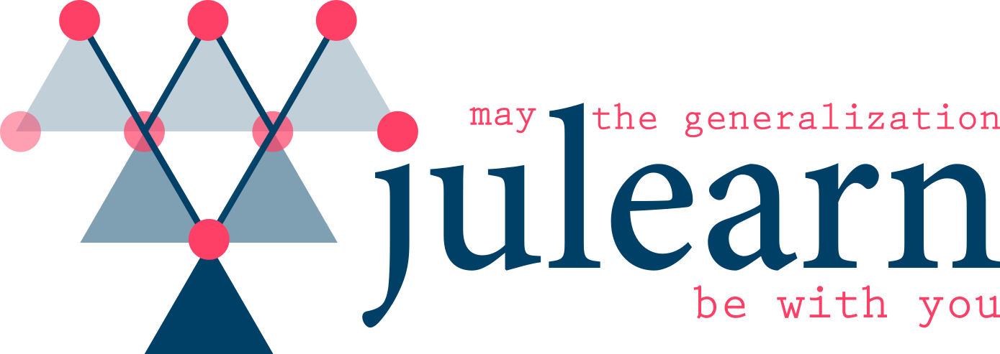

In [206]:
scores = [binary_data[emo][feat[3]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subjects

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
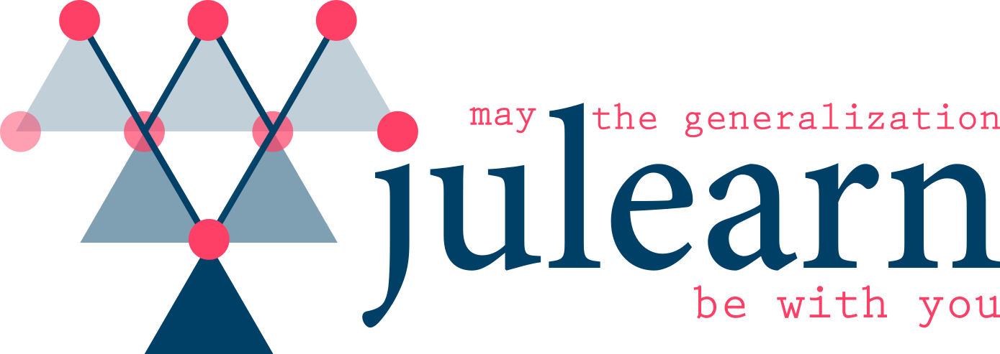

In [299]:
scores = [binary_data[emo][feat[3]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

In [300]:
print(np.min(scores[0]['test_score']), np.median(scores[0]['test_score']),np.max(scores[0]['test_score']))
print(np.min(scores[1]['test_score']), np.median(scores[1]['test_score']),np.max(scores[1]['test_score']))

0.48333333333333334 0.5166666666666667 0.5833333333333334
0.43333333333333335 0.48333333333333334 0.7


---
# Happy vs Angry

In [301]:
emo = emotion_pairs[1]

## FC-Parcellation

### No groups

In [209]:
scores = [binary_data[emo][feat[0]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
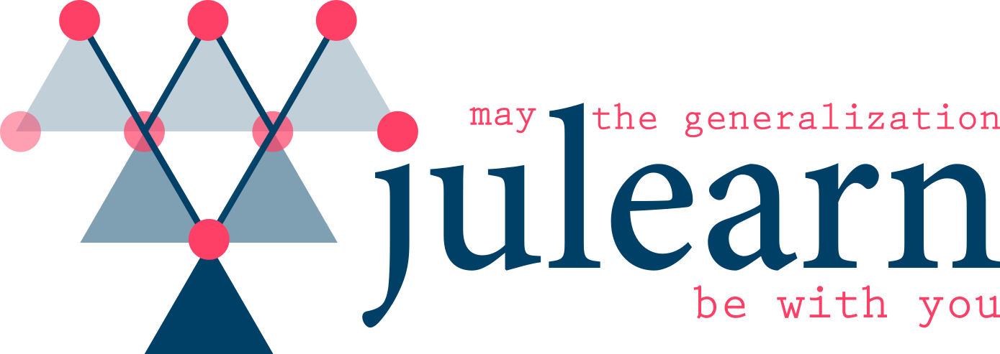

In [210]:
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
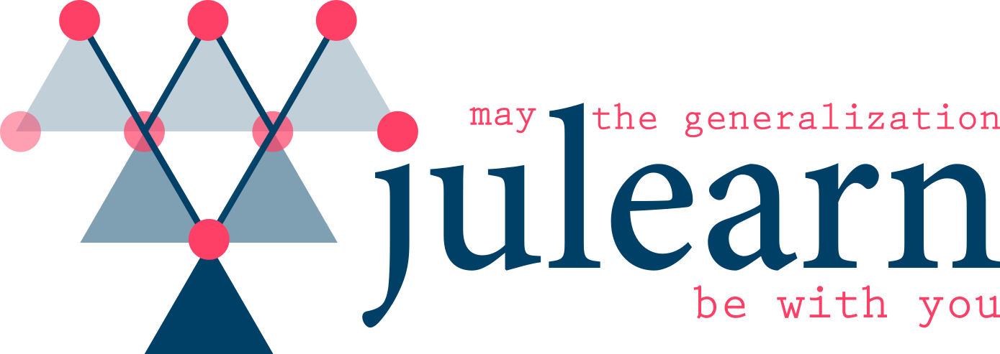

In [211]:
scores = [binary_data[emo][feat[0]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subjects

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
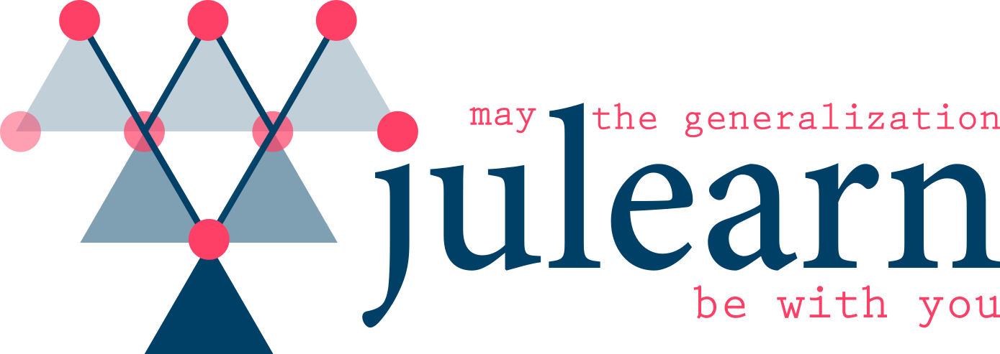

In [302]:
scores = [binary_data[emo][feat[0]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

In [303]:
print(np.min(scores[0]['test_score']), np.median(scores[0]['test_score']),np.max(scores[0]['test_score']))
print(np.min(scores[1]['test_score']), np.median(scores[1]['test_score']),np.max(scores[1]['test_score']))

0.5125 0.55 0.6833333333333333
0.43333333333333335 0.48333333333333334 0.5625


## FC-Spheres

### No groups

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
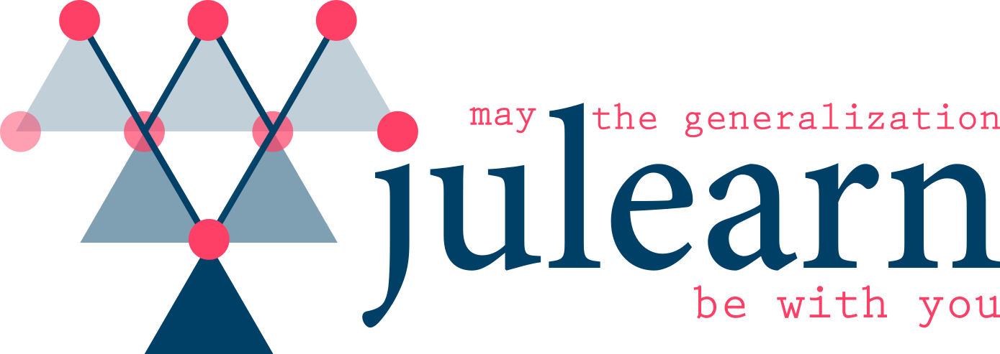

In [213]:
scores = [binary_data[emo][feat[1]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
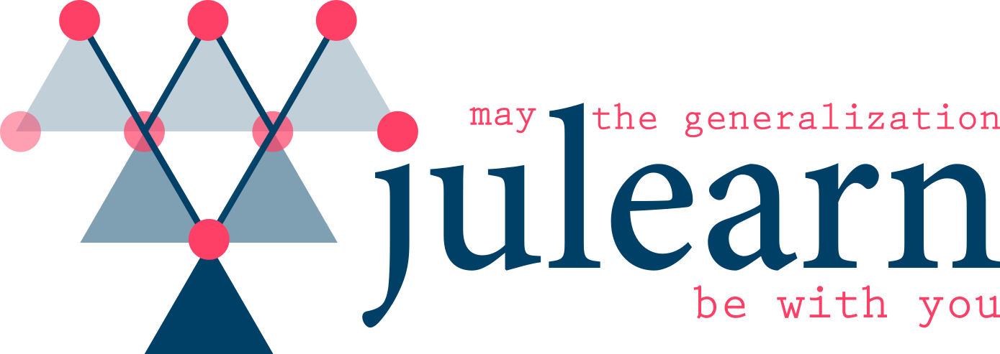

In [214]:
scores = [binary_data[emo][feat[1]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subject

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
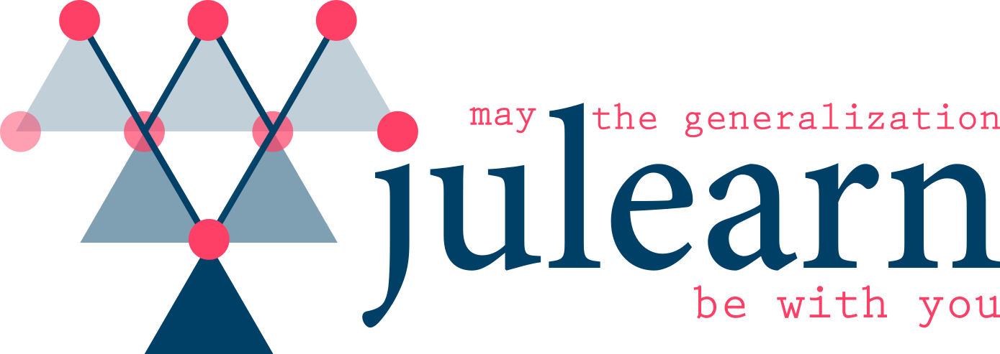

In [304]:
scores = [binary_data[emo][feat[1]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

In [305]:
print(np.min(scores[0]['test_score']), np.median(scores[0]['test_score']),np.max(scores[0]['test_score']))
print(np.min(scores[1]['test_score']), np.median(scores[1]['test_score']),np.max(scores[1]['test_score']))

0.45 0.5166666666666667 0.6125
0.43333333333333335 0.475 0.5


## ReHo-Parcellation

### No groups

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
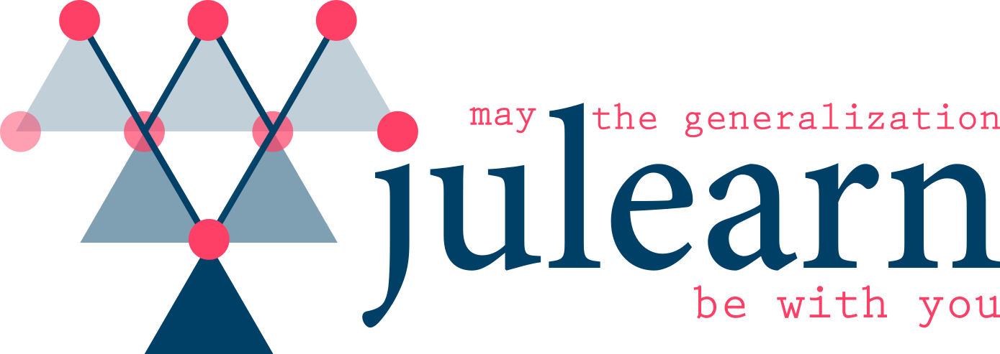

In [216]:
scores = [binary_data[emo][feat[2]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
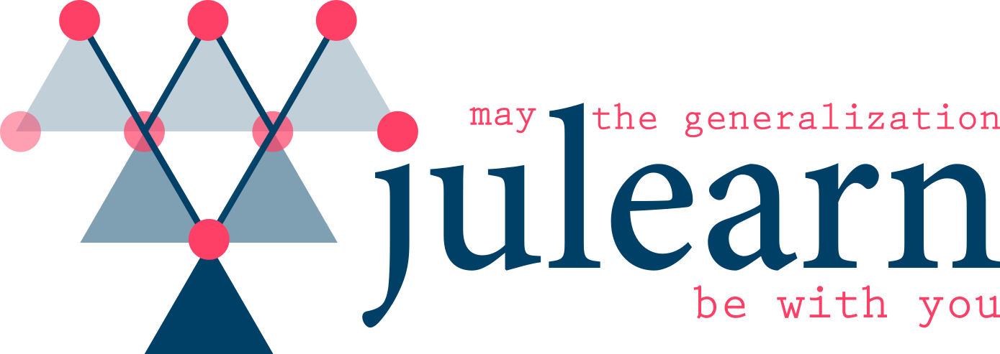

In [217]:
scores = [binary_data[emo][feat[2]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subjects

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
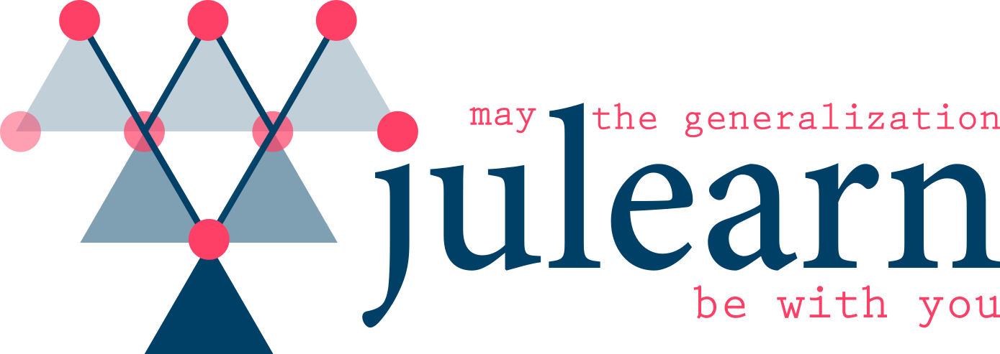

In [306]:
scores = [binary_data[emo][feat[2]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

In [307]:
print(np.min(scores[0]['test_score']), np.median(scores[0]['test_score']),np.max(scores[0]['test_score']))
print(np.min(scores[1]['test_score']), np.median(scores[1]['test_score']),np.max(scores[1]['test_score']))

0.4166666666666667 0.5166666666666667 0.5625
0.4 0.55 0.6125


## ReHo-Spheres

### No groups

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
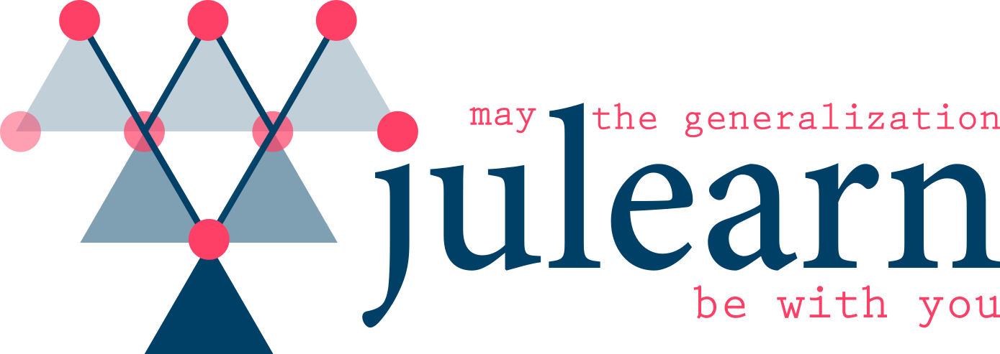

In [219]:
scores = [binary_data[emo][feat[3]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
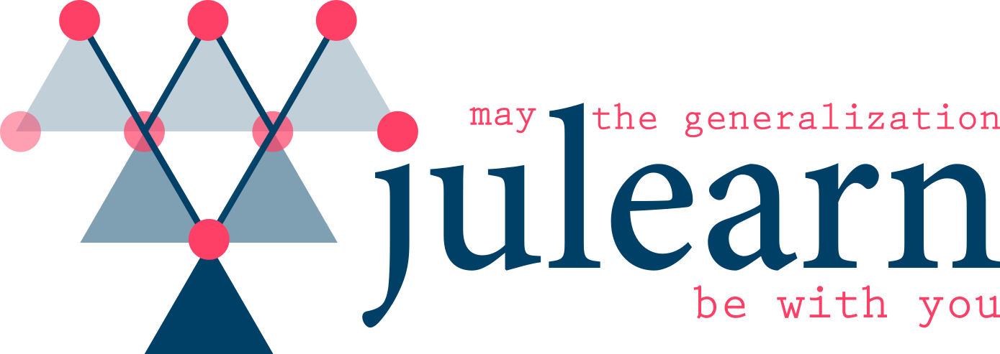

In [220]:
scores = [binary_data[emo][feat[3]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subjects

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
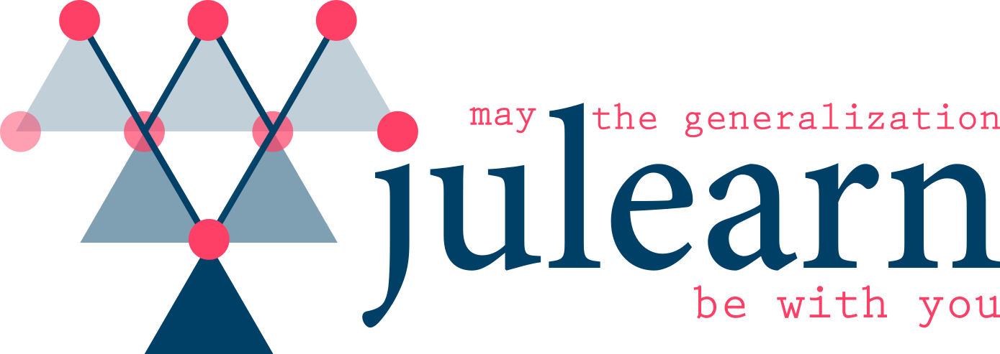

In [308]:
scores = [binary_data[emo][feat[3]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

In [309]:
print(np.min(scores[0]['test_score']), np.median(scores[0]['test_score']),np.max(scores[0]['test_score']))
print(np.min(scores[1]['test_score']), np.median(scores[1]['test_score']),np.max(scores[1]['test_score']))

0.4666666666666667 0.5166666666666667 0.5333333333333333
0.43333333333333335 0.5 0.5375


---

# Happy vs Neutral

In [310]:
emo = emotion_pairs[2]

## FC-Parcellation

### No groups

In [223]:
scores = [binary_data[emo][feat[0]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
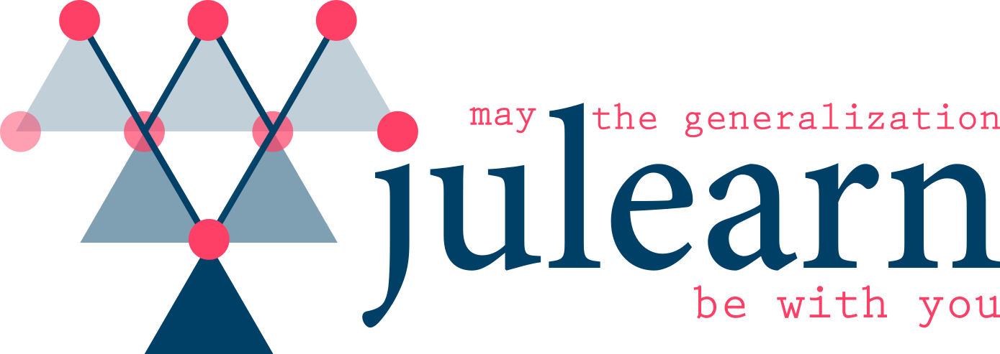

In [224]:
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
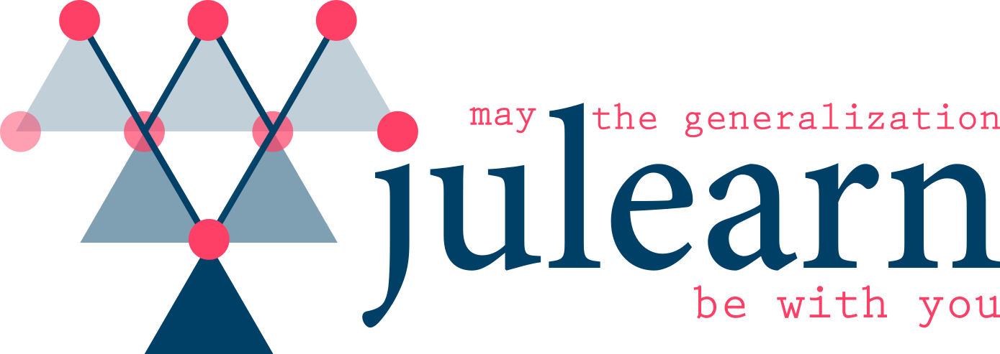

In [225]:
scores = [binary_data[emo][feat[0]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subjects

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
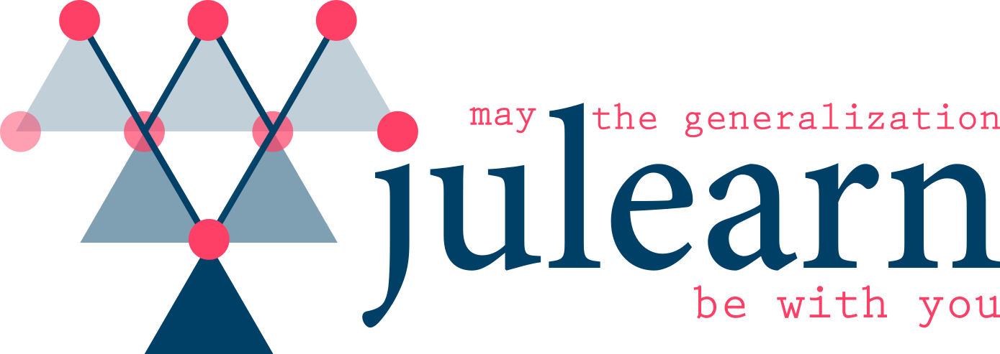

In [311]:
scores = [binary_data[emo][feat[0]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

In [312]:
print(np.min(scores[0]['test_score']), np.median(scores[0]['test_score']),np.max(scores[0]['test_score']))
print(np.min(scores[1]['test_score']), np.median(scores[1]['test_score']),np.max(scores[1]['test_score']))

0.5 0.55 0.5833333333333334
0.45 0.48333333333333334 0.5833333333333334


## FC-Spheres

### No groups

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
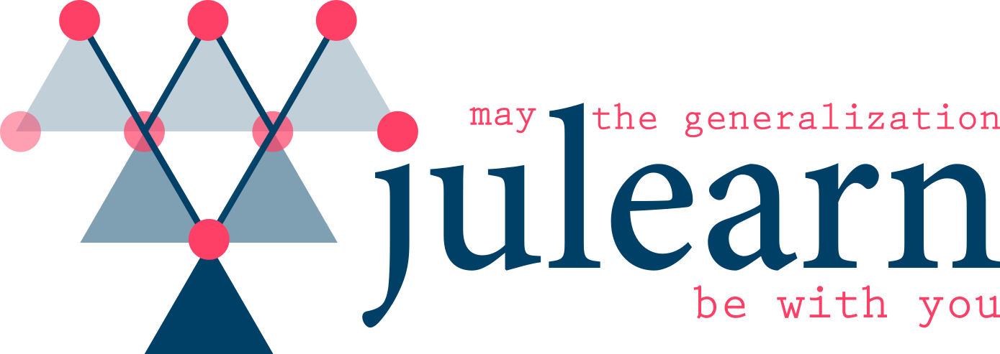

In [227]:
scores = [binary_data[emo][feat[1]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
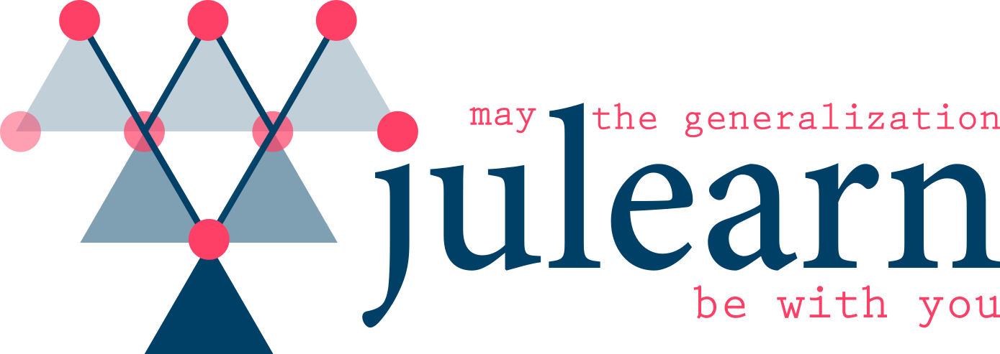

In [228]:
scores = [binary_data[emo][feat[1]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subject

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
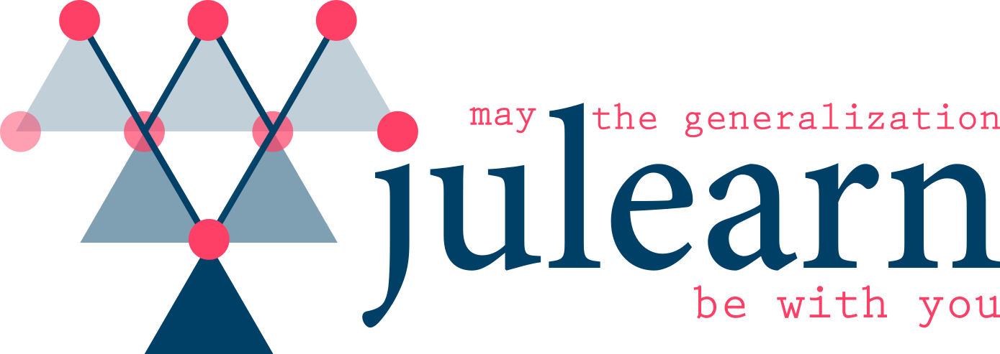

In [313]:
scores = [binary_data[emo][feat[1]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

In [314]:
print(np.min(scores[0]['test_score']), np.median(scores[0]['test_score']),np.max(scores[0]['test_score']))
print(np.min(scores[1]['test_score']), np.median(scores[1]['test_score']),np.max(scores[1]['test_score']))

0.5 0.5833333333333334 0.625
0.5333333333333333 0.55 0.5666666666666667


## ReHo-Parcellation

### No groups

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
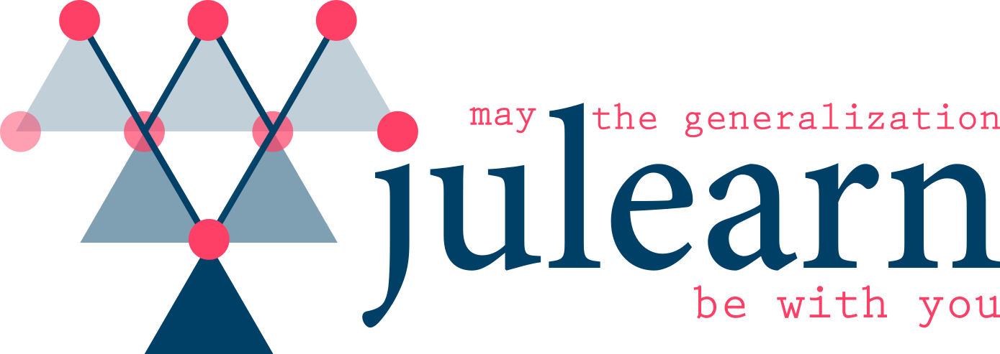

In [230]:
scores = [binary_data[emo][feat[2]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
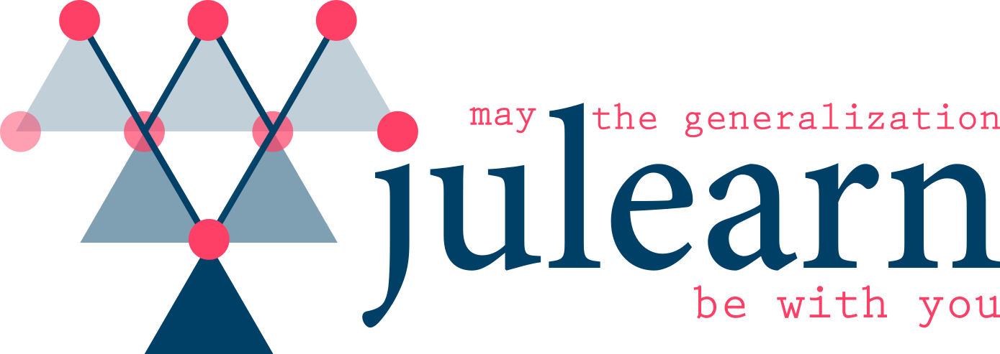

In [231]:
scores = [binary_data[emo][feat[2]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subjects

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
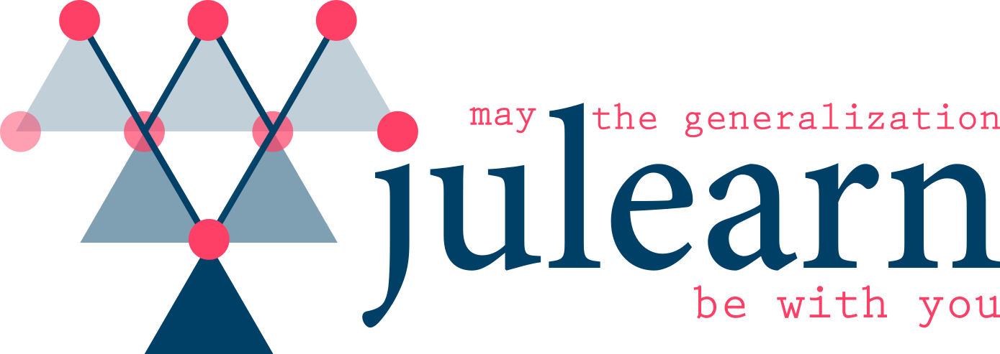

In [315]:
scores = [binary_data[emo][feat[2]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

In [317]:
print(np.min(scores[0]['test_score']), np.median(scores[0]['test_score']),np.max(scores[0]['test_score']))
print(np.min(scores[1]['test_score']), np.median(scores[1]['test_score']),np.max(scores[1]['test_score']))

0.5166666666666667 0.5375 0.6833333333333333
0.45 0.55 0.6166666666666667


## ReHo-Spheres

### No groups

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
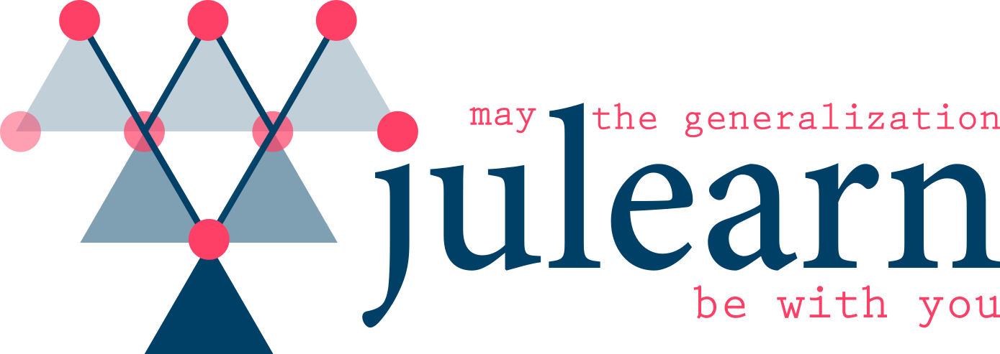

In [233]:
scores = [binary_data[emo][feat[3]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
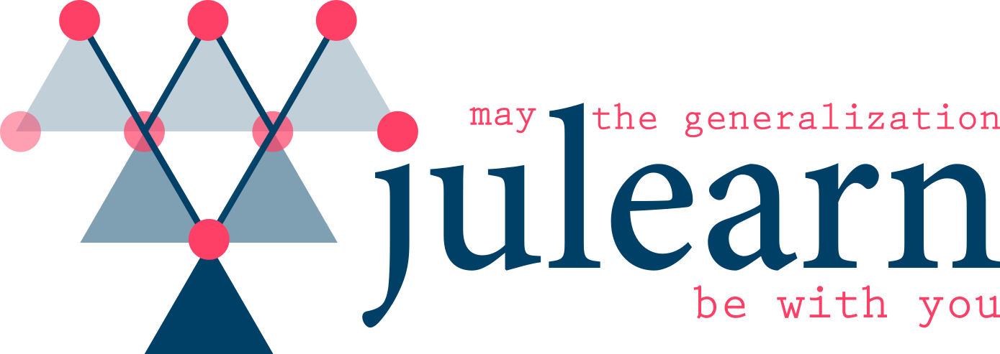

In [234]:
scores = [binary_data[emo][feat[3]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subjects

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
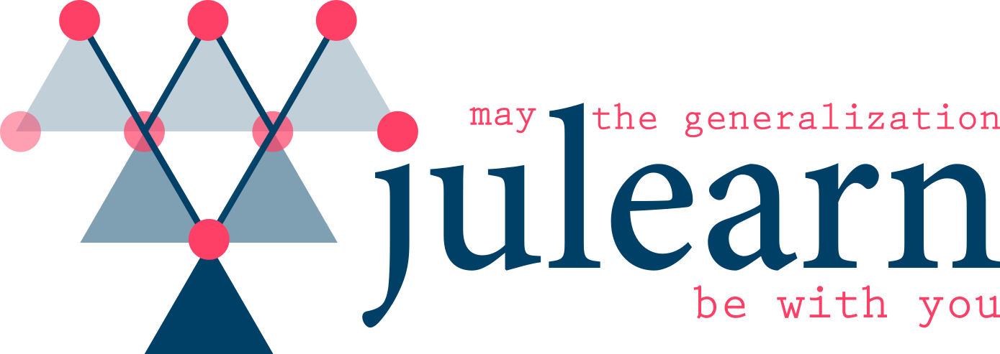

In [318]:
scores = [binary_data[emo][feat[3]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

In [319]:
print(np.min(scores[0]['test_score']), np.median(scores[0]['test_score']),np.max(scores[0]['test_score']))
print(np.min(scores[1]['test_score']), np.median(scores[1]['test_score']),np.max(scores[1]['test_score']))

0.45 0.5375 0.5833333333333334
0.45 0.5 0.5375


---

# Sad vs Angry

In [236]:
emo = emotion_pairs[3]
emo

('sad', 'angry')

## FC-Parcellation

### No groups

In [237]:
scores = [binary_data[emo][feat[0]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
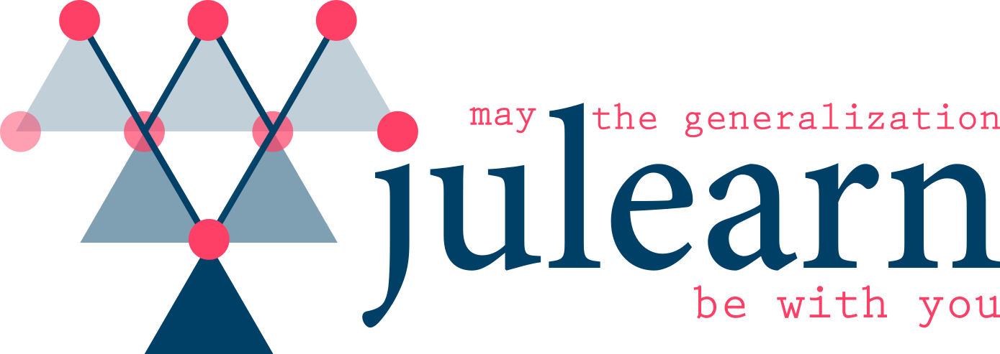

In [238]:
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
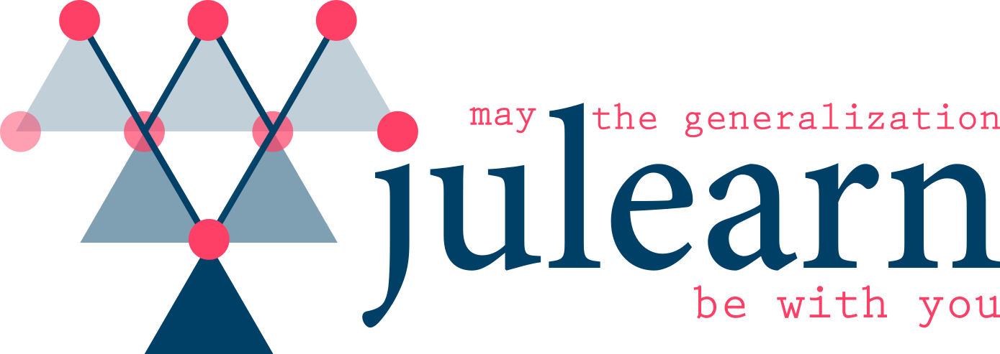

In [239]:
scores = [binary_data[emo][feat[0]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subjects

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
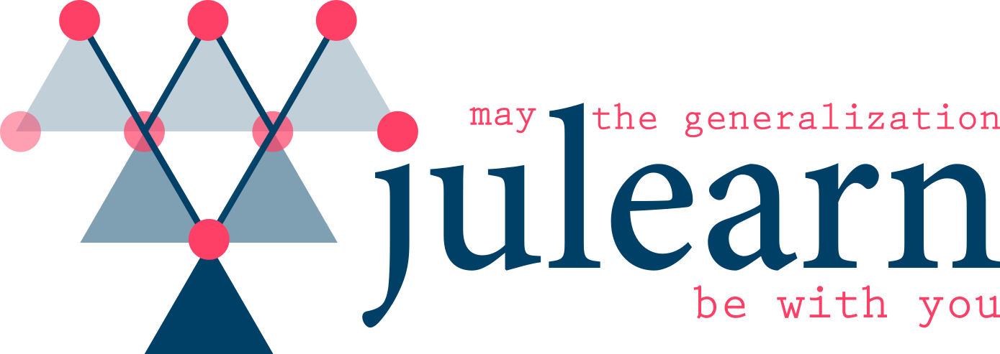

In [240]:
scores = [binary_data[emo][feat[0]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

## FC-Spheres

### No groups

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
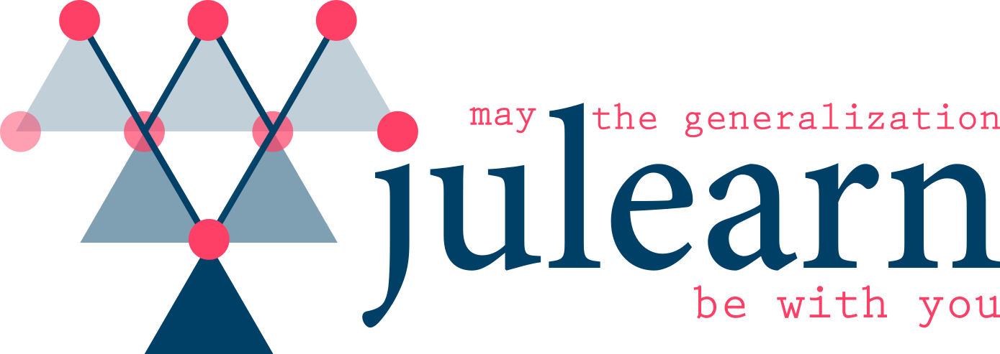

In [241]:
scores = [binary_data[emo][feat[1]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
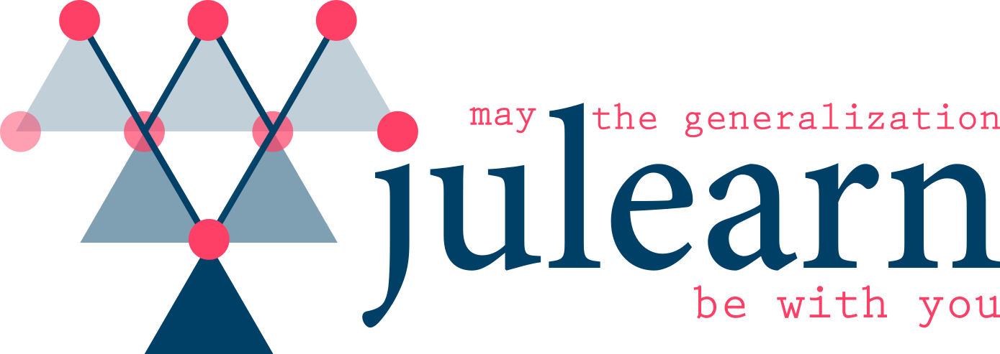

In [242]:
scores = [binary_data[emo][feat[1]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subject

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
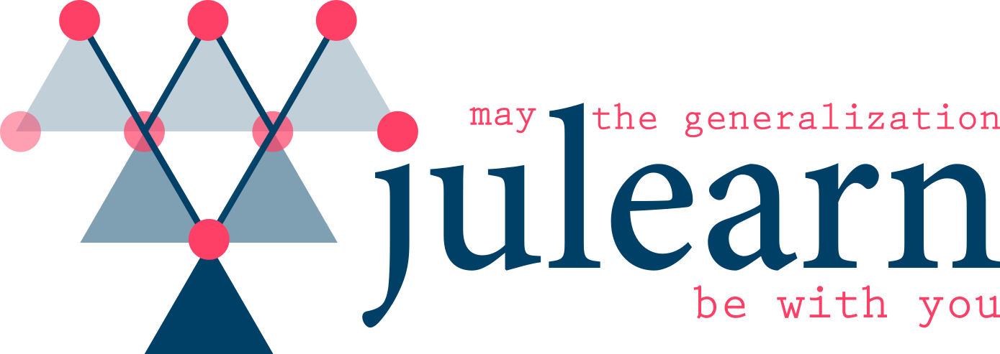

In [243]:
scores = [binary_data[emo][feat[1]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

## ReHo-Parcellation

### No groups

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
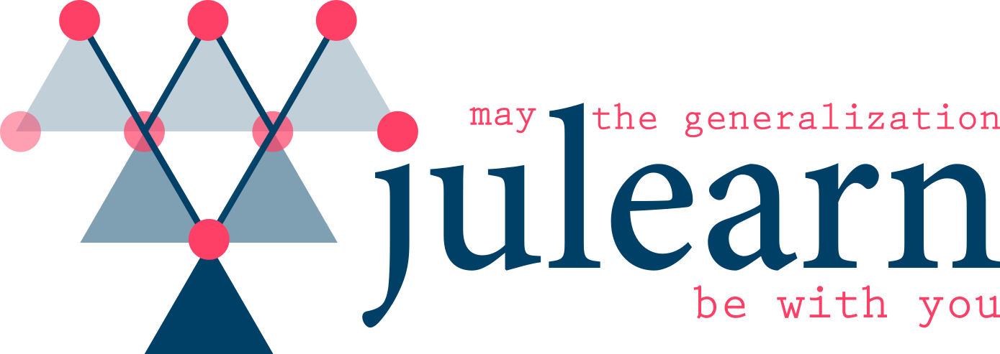

In [244]:
scores = [binary_data[emo][feat[2]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
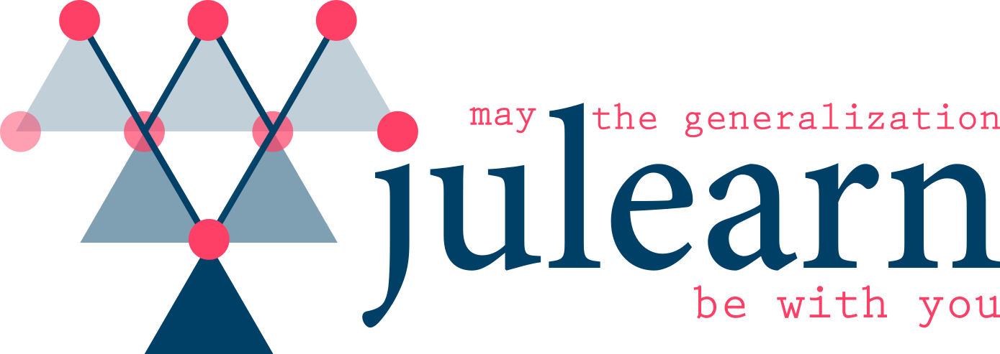

In [245]:
scores = [binary_data[emo][feat[2]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subjects

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
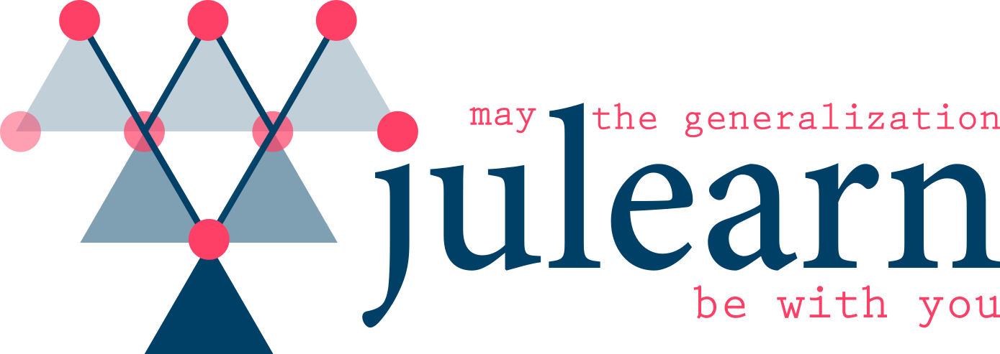

In [246]:
scores = [binary_data[emo][feat[2]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

## ReHo-Spheres

### No groups

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
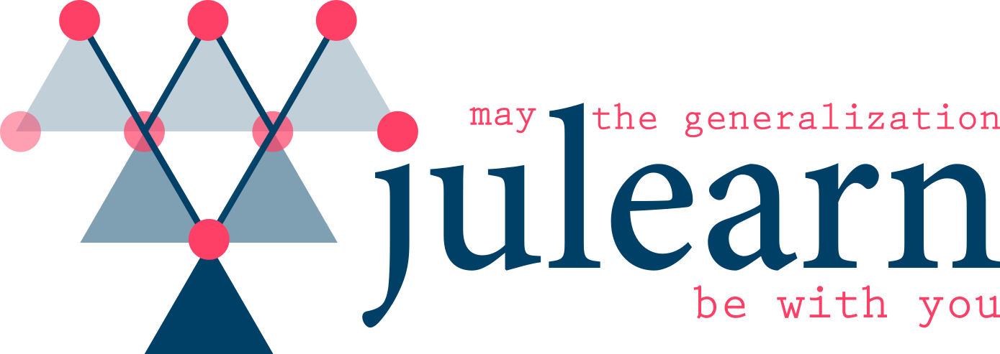

In [247]:
scores = [binary_data[emo][feat[3]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
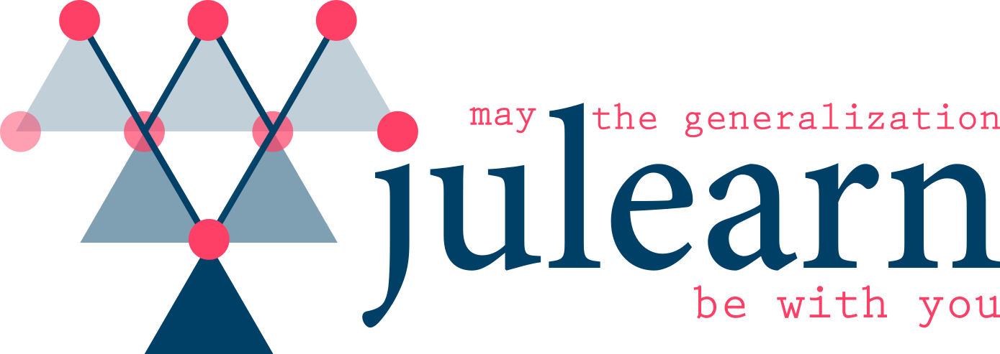

In [248]:
scores = [binary_data[emo][feat[3]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subjects

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
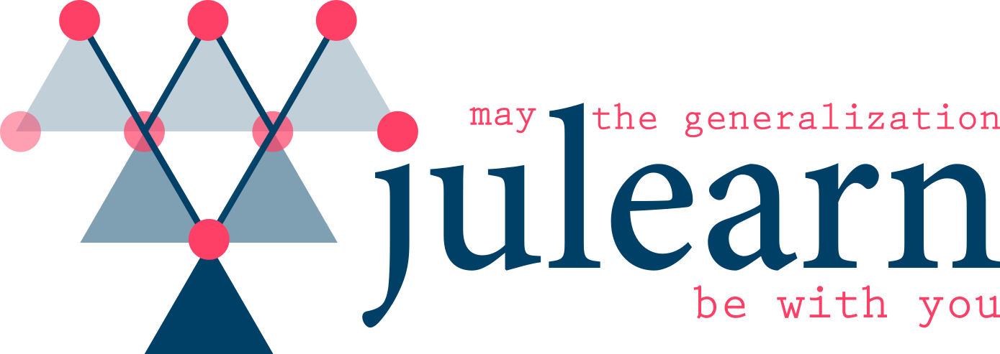

In [249]:
scores = [binary_data[emo][feat[3]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

---

# Sad vs Neutral

In [250]:
emo = emotion_pairs[4]
emo

('sad', 'neutral')

## FC-Parcellation

### No groups

In [251]:
scores = [binary_data[emo][feat[0]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
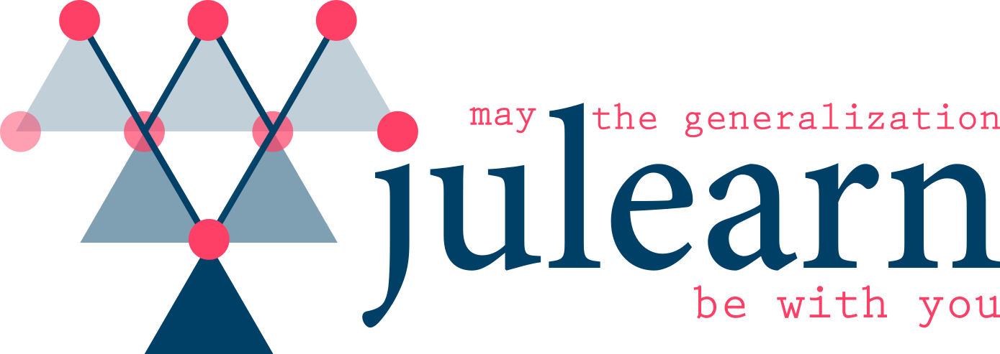

In [252]:
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
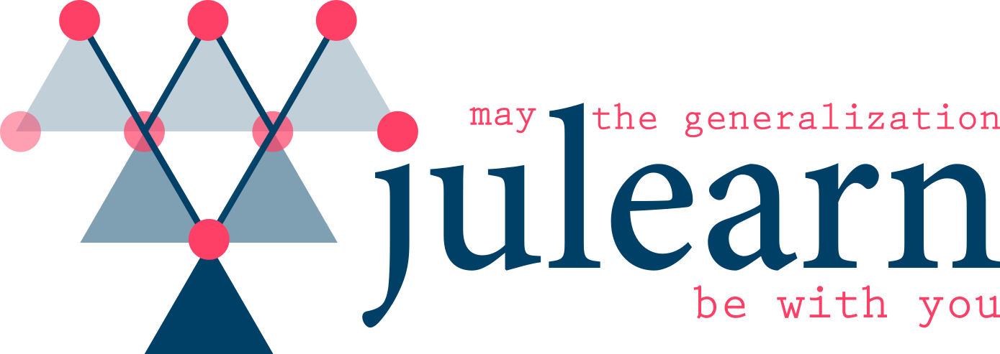

In [253]:
scores = [binary_data[emo][feat[0]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subjects

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
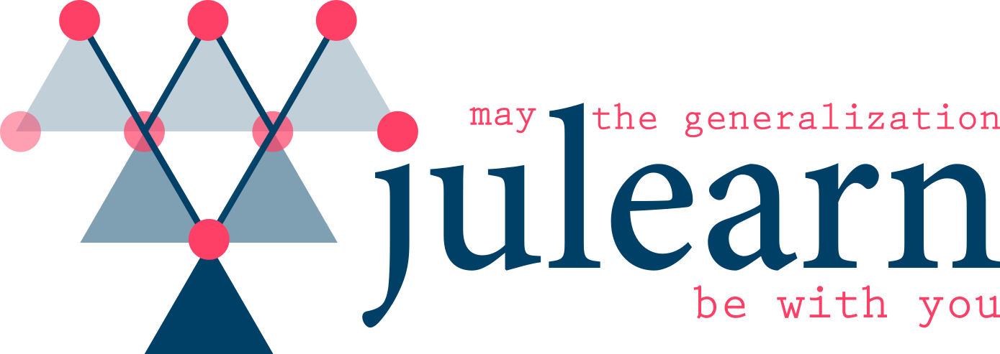

In [254]:
scores = [binary_data[emo][feat[0]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

## FC-Spheres

### No groups

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
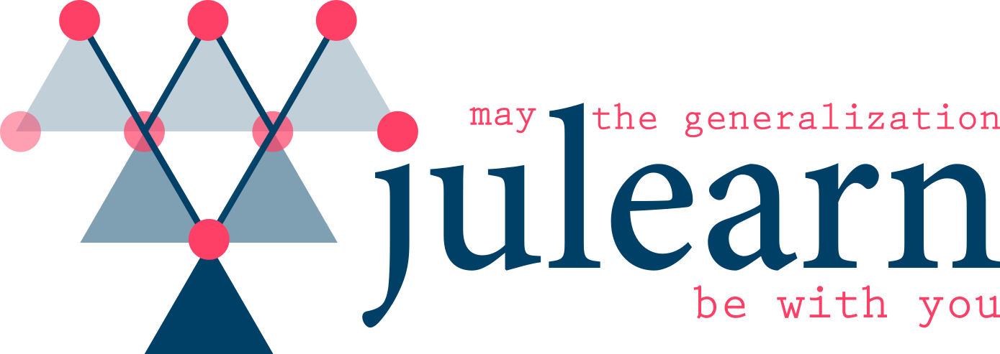

In [255]:
scores = [binary_data[emo][feat[1]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
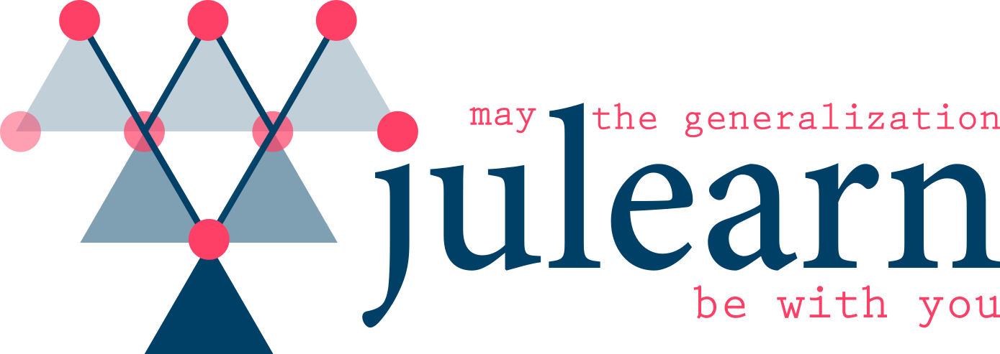

In [256]:
scores = [binary_data[emo][feat[1]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subject

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
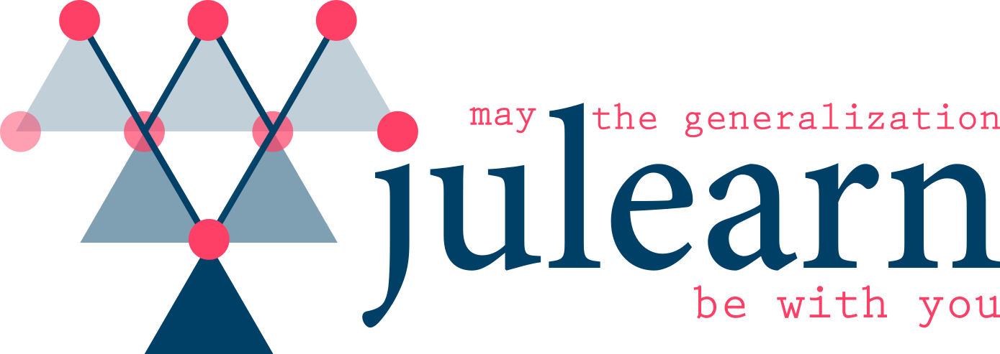

In [257]:
scores = [binary_data[emo][feat[1]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

## ReHo-Parcellation

### No groups

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
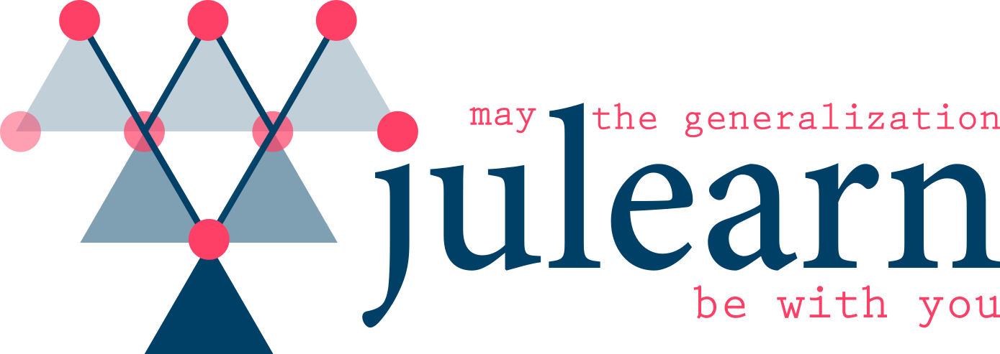

In [258]:
scores = [binary_data[emo][feat[2]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
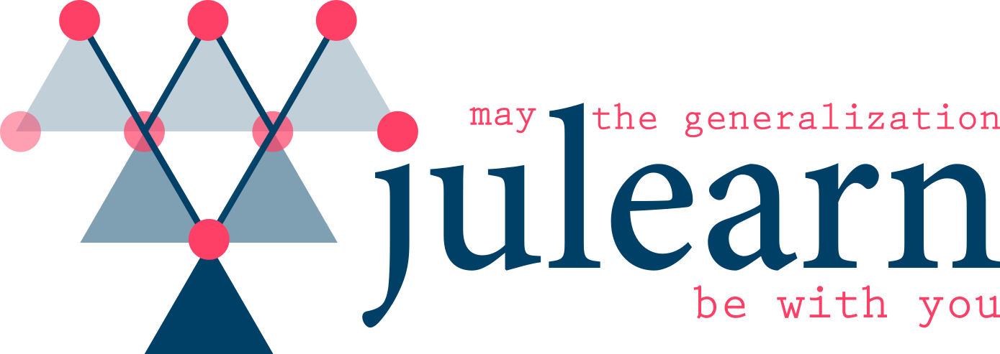

In [259]:
scores = [binary_data[emo][feat[2]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subjects

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
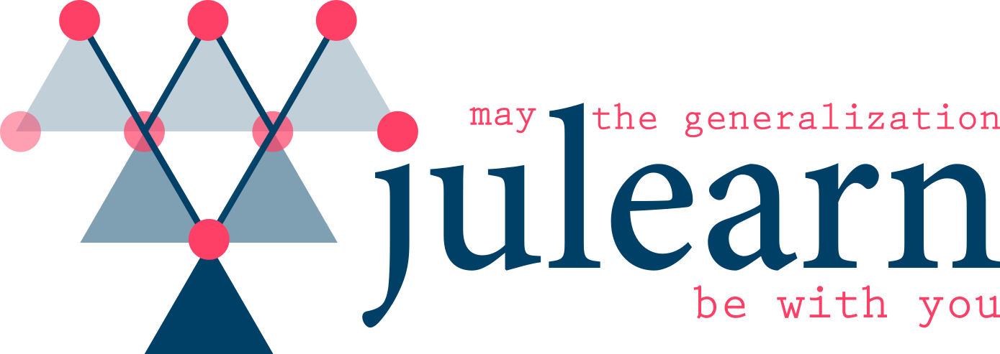

In [260]:
scores = [binary_data[emo][feat[2]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

## ReHo-Spheres

### No groups

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
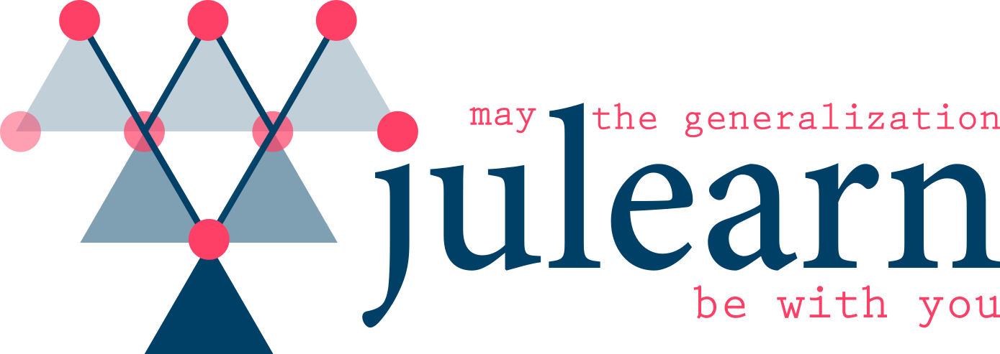

In [261]:
scores = [binary_data[emo][feat[3]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
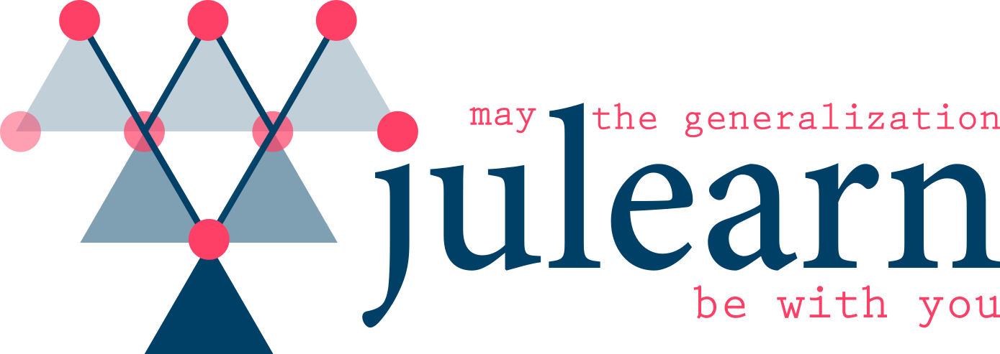

In [262]:
scores = [binary_data[emo][feat[3]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subjects

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
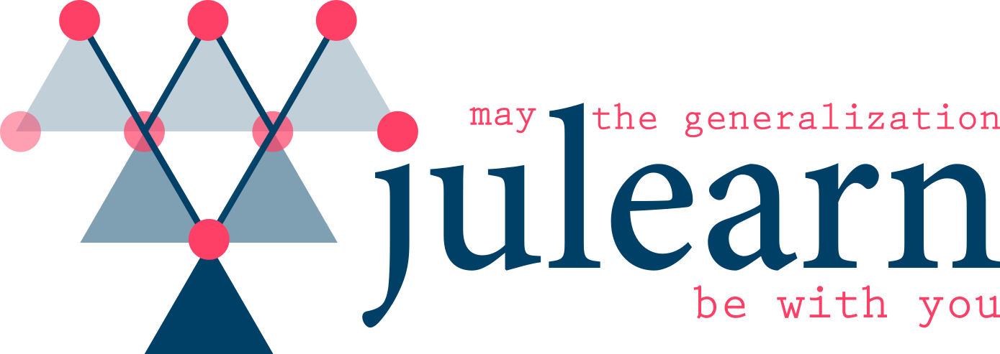

In [263]:
scores = [binary_data[emo][feat[3]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

# Angry vs Neutral

In [264]:
emo = emotion_pairs[5]
emo

('angry', 'neutral')

## FC-Parcellation

### No groups

In [265]:
scores = [binary_data[emo][feat[0]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
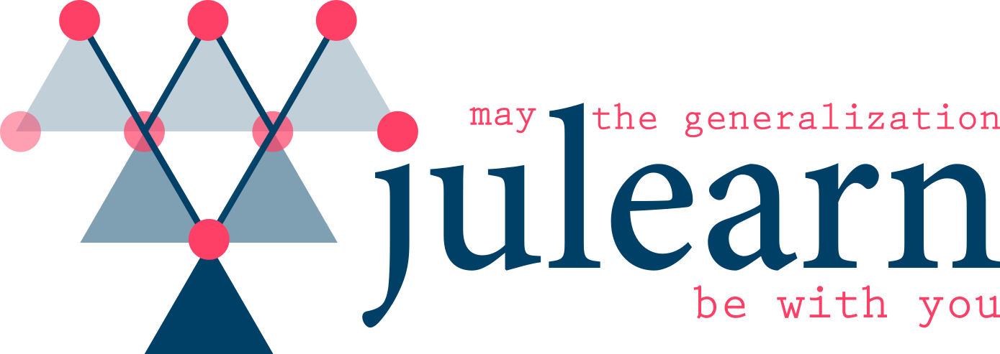

In [266]:
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
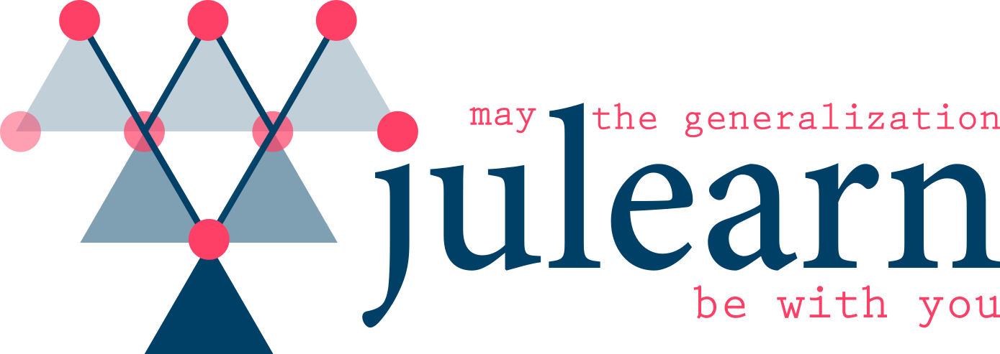

In [267]:
scores = [binary_data[emo][feat[0]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subjects

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
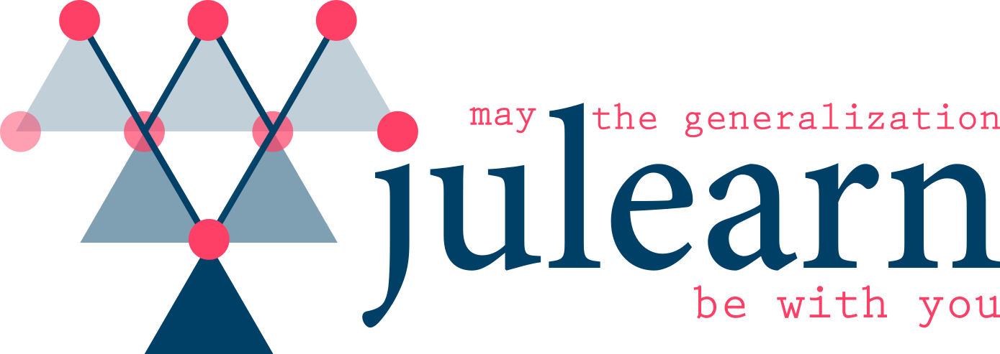

In [268]:
scores = [binary_data[emo][feat[0]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

## FC-Spheres

### No groups

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
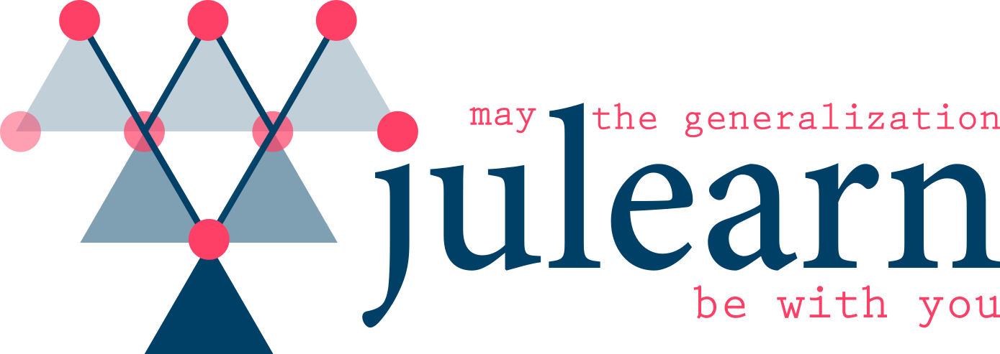

In [269]:
scores = [binary_data[emo][feat[1]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
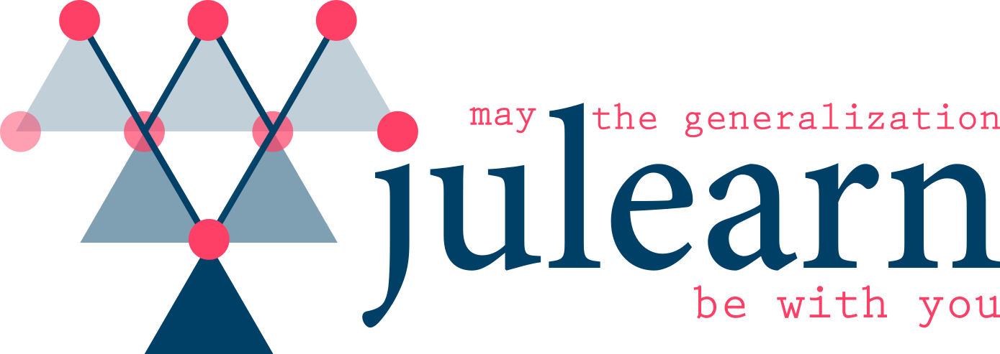

In [270]:
scores = [binary_data[emo][feat[1]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subject

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
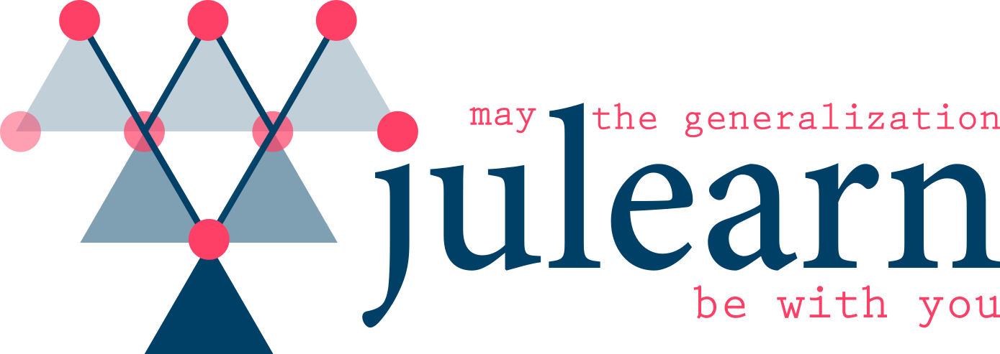

In [271]:
scores = [binary_data[emo][feat[1]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

## ReHo-Parcellation

### No groups

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
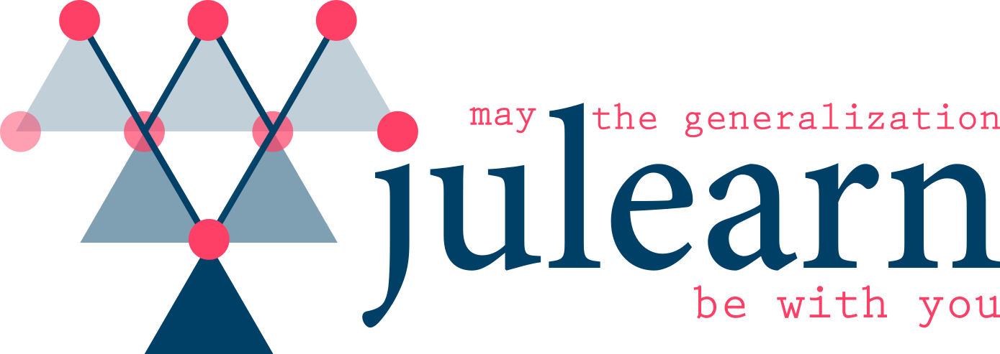

In [272]:
scores = [binary_data[emo][feat[2]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
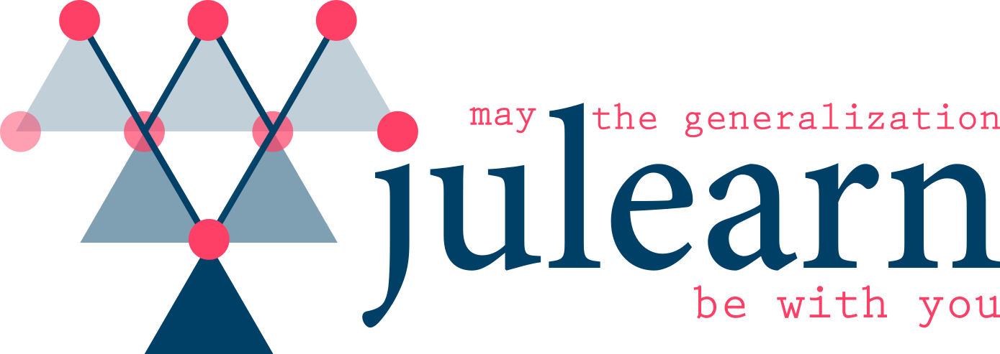

In [273]:
scores = [binary_data[emo][feat[2]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subjects

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
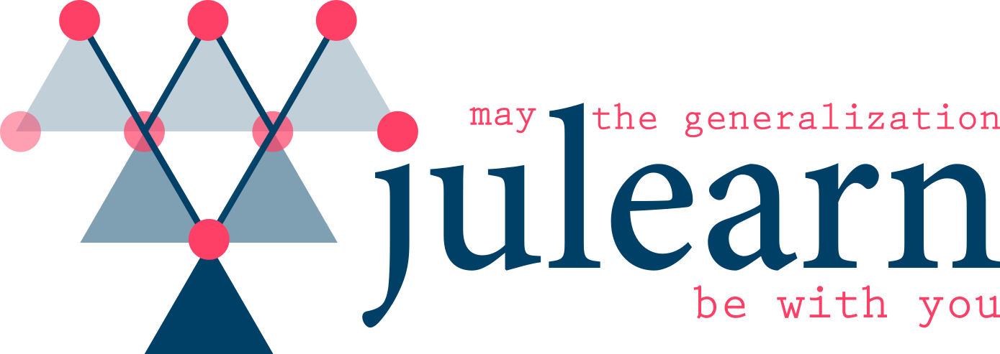

In [286]:
scores = [binary_data[emo][feat[2]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

In [287]:
print(np.min(scores[0]['test_score']), np.median(scores[0]['test_score']),np.max(scores[0]['test_score']))
print(np.min(scores[1]['test_score']), np.median(scores[1]['test_score']),np.max(scores[1]['test_score']))

0.4 0.5166666666666667 0.55
0.4 0.4666666666666667 0.5666666666666667


## ReHo-Spheres

### No groups

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
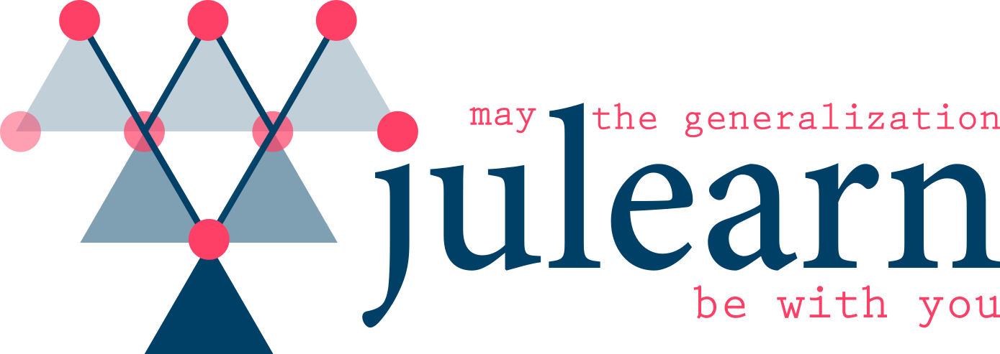

In [275]:
scores = [binary_data[emo][feat[3]]["no_groups"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Runs

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
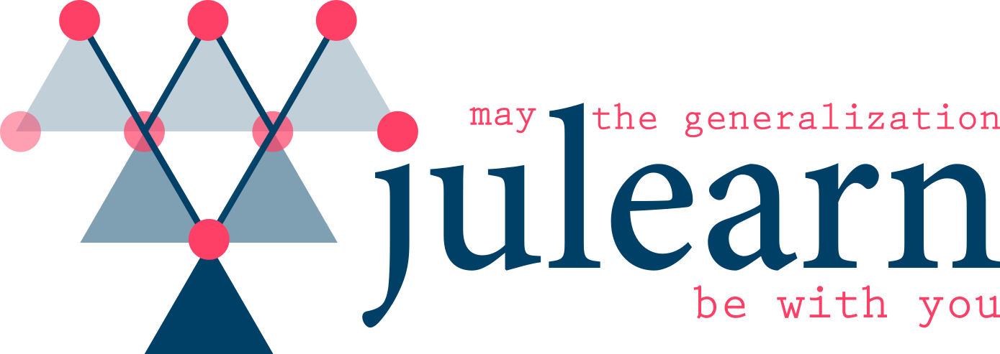

In [276]:
scores = [binary_data[emo][feat[3]]["runs"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot

### Subjects

Column
    [0] Row
        [0] PNG(str, width=200)
        [1] Spacer(width=50)
        [2] Markdown(str)
    [1] Row
        [0] Param(_JulearnScoresViewer, name='Metric', parameters=['metric'], widgets={'metric': {'type': <class...})
        [1] Param(_JulearnScoresViewer, name='Statistics', parameters=['show_stats'], widgets={'show_stats': {'type': <c...})
        [2] Param(_JulearnScoresViewer, name='Aggregate Repeats', parameters=['group_repeats'], widgets={'group_repeats': {'type':...})
    [2] Row
        [0] ParamMethod(method, _pane=Bokeh, defer_load=False)
        [1] Column
            [0] Param(_JulearnScoresViewer, name='Sets', parameters=['sets'], widgets={'sets': {'type': <class '...})
            [1] Param(_JulearnScoresViewer, name='Models', parameters=['models'], widgets={'models': {'type': <class...})
    [3] ParamMethod(method, _pane=Markdown, defer_load=False)
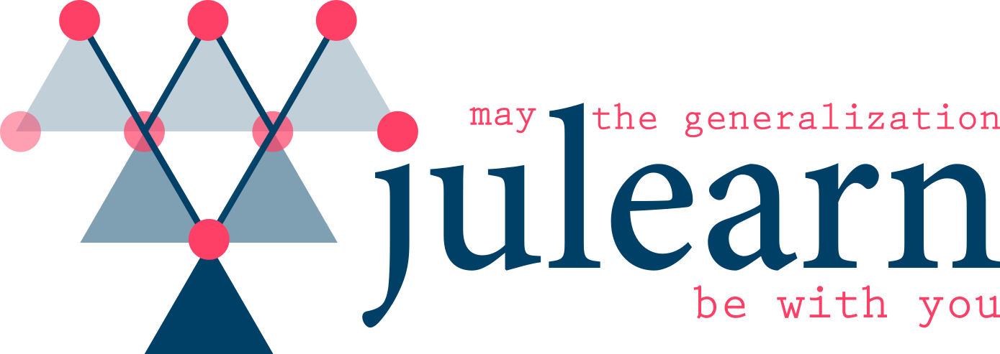

In [277]:
scores = [binary_data[emo][feat[3]]["subjects"][m]["scores"] for m in ["SVM", "Random Forest", "Dummy"]]
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    plot = plot_scores(*scores)
plot